# pre

## import & setting

In [1]:
import anndata as ad
import scanpy as sc
import numpy as np
import seaborn as sns
import palettable
import pandas as pd
import scipy.io as sio
import pickle
import sys
import scipy
sys.path.append('/home/yzy/bioSIMS/code/analysis')
from utils_220 import *
# sc.set_figure_params(dpi=500, color_map='viridis')
sc.set_figure_params(dpi=500, color_map='viridis',dpi_save=500,transparent=True)

sc.settings.verbosity = 2
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

# %matplotlib inline


Using TensorFlow backend.
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.cluster.bicluster module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)


## functions

In [20]:
def cal_cell_lineseg_dist(p1, p2,c):
    point=c
    line = [p1,p2]
    
    
    unit_line = line[1] - line[0]
    norm_unit_line = unit_line / np.linalg.norm(unit_line)

    
    segment_dist = (
        np.linalg.norm(np.cross(line[1] - line[0], line[0] - point)) /
        np.linalg.norm(unit_line)
    )

    diff = (
        (norm_unit_line[0] * (point[0] - line[0][0])) + 
        (norm_unit_line[1] * (point[1] - line[0][1]))
    )

    x_seg = (norm_unit_line[0] * diff) + line[0][0]
    y_seg = (norm_unit_line[1] * diff) + line[0][1]

    endpoint_dist = min(
        np.linalg.norm(line[0] - point),
        np.linalg.norm(line[1] - point)
    )

    lp1_x = line[0][0]  # line point 1 x
    lp1_y = line[0][1]  # line point 1 y
    lp2_x = line[1][0]  # line point 2 x
    lp2_y = line[1][1]  # line point 2 y
    is_betw_x = lp1_x <= x_seg <= lp2_x or lp2_x <= x_seg <= lp1_x
    is_betw_y = lp1_y <= y_seg <= lp2_y or lp2_y <= y_seg <= lp1_y
    
#     sign=np.sign(cal_cell_line_dist(p1,p2,c))
    
    if is_betw_x and is_betw_y:
        return segment_dist
    else:
        # if not, then return the minimum distance to the segment endpoints
        return endpoint_dist

In [3]:
def plot_dist_box(hepa_dist_pd_dict,save):
    hepa_dist_pd_df = pd.DataFrame(hepa_dist_pd_dict)

    import seaborn as sns
    sns.set(style="ticks", palette="pastel")

#     save = 'figures/fibro_dist_box3.png'
    # Load the example tips dataset
    # tips = sns.load_dataset("tips")

    # Draw a nested boxplot to show bills by day and time
    fig,ax = plt.subplots(1,1,figsize=(4,4))
    g = sns.boxplot(x="dist_lim", y="dist",
                hue="hepa_type", palette=["#FF005C", "#68FF00"],saturation=1,fliersize=1,linewidth=2,
                data=hepa_dist_pd_df,ax=ax)
    sns.despine(offset=10, trim=True)
    ax.get_legend().remove()

    for i,box in enumerate(ax.artists):
        box.set_edgecolor('black')
    #     box.set_facecolor('white')

        # iterate over whiskers and median lines
        for j in range(6*i,6*(i+1)):
             ax.lines[j].set_color('black')

    # plt.savefig(save,transparent=True,format='png',bbox_inches='tight',dpi=500)
    ax.spines["bottom"].set_color("black")
    ax.spines["left"].set_color("black")
    # ax.spines["left"].set_facecolor("red")
    ax.spines["left"].set_linewidth(2)
    ax.spines["bottom"].set_linewidth(2)
    ax.xaxis.set_tick_params(width=2)
    ax.yaxis.set_tick_params(width=2)
    # ax.tick_params(axis='y', labelcolor='red')
    # ax.tick_params(axis='x', labelcolor=color)
    # plt.setp(ax.lines, color='blue')
    if save:
#         print(111)
        plt.savefig(save,transparent=True,format='png',bbox_inches='tight',dpi=500)


In [4]:
def plot_count_ratio(count_ratio_standard_list,thre_list,save):
    sns.set_style('white')
#     save_tmp = 'figures/fibro_dist_line_{0}.png'

    t=thre_list
    data1 = count_ratio_standard_list
    # data2 = -np.log10(dist_pvalue_list2)
    fig, ax1 = plt.subplots(1,1,figsize=(6/1.5,5/1.5))

    color = 'k'
    ax1.set_xlabel('distance to Fib border')
    ax1.set_ylabel('scaled cell count ratio', color=color)
    ax1.plot(t, data1, color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    # ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    # color = 'tab:blue'
    # ax2.set_ylabel('P value (-log10)', color=color)  # we already handled the x-label with ax1
    # ax2.plot(t, data2, color=color)
    # ax2.tick_params(axis='y', labelcolor=color)
    ax1.spines["bottom"].set_color("black")
    ax1.spines["left"].set_color("black")

    ax1.spines["top"].set_color("black")
    ax1.spines['right'].set_color("black")
    # ax.spines["left"].set_facecolor("red")
    # ax1.spines["left"].set_linewidth(2)
    # ax1.spines["bottom"].set_linewidth(2)
    ax1.xaxis.set_tick_params(width=2)
    ax1.yaxis.set_tick_params(width=2)
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    # plt.show()
    if save:
        
        plt.savefig(save,transparent=True,format='png',bbox_inches='tight',dpi=500)
    # plt.savefig(transparent=True,format='png',bbox_inches='tight',dpi=500)


In [5]:
def get_fibro_stat(a_use,start_dist,k_split,end_dist):
    # a_use = a_concat_6
    c_hep_normal='5'
    c_hep_87='6'
    # c_hep_87_ = '5'
    # c_hep_87='3'
    cur_exp_name='final_cls'

    hepa_dist_pd_dict = {
        'dist':[],
        'dist_lim':[],
        'hepa_type':[]
    }


    a_hep_normal = a_use[a_use.obs[cur_exp_name]==c_hep_normal]
    a_hep_normal = a_hep_normal[a_hep_normal.obs['fibro_dist_mum']>0]
    # a_hep_87 = a[a.obs[cur_exp_name]==c_hep_87]
    a_hep_87 = a_use[a_use.obs[cur_exp_name].isin([c_hep_87])]
    a_hep_87 = a_hep_87[a_hep_87.obs['fibro_dist_mum']>0]


    a_hep_all = a_use[a_use.obs[cur_exp_name].isin([c_hep_87,c_hep_normal])]
    a_hep_all = a_hep_all[a_hep_all.obs['fibro_dist_mum']>0]

    thre_list = []
    count_normal_list = []
    count_normal_standard_list = []
    count_87_list = []
    count_87_standard_list = []
    count_ratio_list = []
    count_ratio_standard_list =[]
    dist_pvalue_list = []
    dist_pvalue_list2 = []
    dist_87_list = []
    dist_normal_list = []
    dist_all_list = []
    dist_ratio_list = []

    a_hep_87_num = a_hep_87.shape[0]
    a_hep_normal_num = a_hep_normal.shape[0]
    prev_i = 0
    # start_dist = 10
    # k_split = 8
    thre_range = range(start_dist,end_dist,k_split)
    
#     if k_split>=0:
        
#         thre_range = range(start_dist,end_dist,100)
#     else:
#         thre_range = range(start_dist,end_dist,1)
    # thre_range = [100,200,250,300,350,400,450]
    # thre_range = [100,200,300,400,500]

    for i in thre_range:
        if i%100==0:
            print(i)
        cur_a_all = a_hep_all[a_hep_all.obs['fibro_dist_mum']<i]
        cur_a_87 = a_hep_87[a_hep_87.obs['fibro_dist_mum']<i]
        cur_a_normal = a_hep_normal[a_hep_normal.obs['fibro_dist_mum']<i]



        cur_dist_87 = cur_a_87.obs['fibro_dist_mum']
        cur_dist_all = cur_a_all.obs['fibro_dist_mum']
        cur_dist_normal = cur_a_normal.obs['fibro_dist_mum']

        dist_87_list.append(np.mean(cur_dist_87))
        dist_normal_list.append(np.mean(cur_dist_normal))
        dist_all_list.append(np.mean(cur_dist_all))
        dist_ratio_list.append(np.mean(np.mean(cur_dist_normal)/np.mean(cur_dist_87)))



    #     cur_dist_87_resample = np.random.choice(cur_dist_87, a_hep_87_num)
    #     cur_dist_normal_resample = np.random.choice(cur_dist_normal, a_hep_normal_num)



        _,pvalue = scipy.stats.ranksums(cur_dist_87,cur_dist_normal)
        _,pvalue2 = scipy.stats.ttest_ind(cur_dist_87,cur_dist_normal)

        dist_pvalue_list.append(pvalue)
        dist_pvalue_list2.append(pvalue2)

        count_normal = np.sum(a_hep_normal.obs['fibro_dist_mum']<i)
        count_normal_standard = count_normal/a_hep_normal.shape[0]
        count_87 = np.sum(a_hep_87.obs['fibro_dist_mum']<i)
        count_87_standard = count_87/a_hep_87.shape[0]

        thre_list.append(i)
        count_normal_list.append(count_normal)
        count_87_list.append(count_87)
        count_ratio_list.append(count_87/count_normal)

        count_normal_standard_list.append(count_normal_standard)
        count_87_standard_list.append(count_87_standard)
        count_ratio_standard_list.append(count_87_standard/count_normal_standard)


        cur_dist_list = list(cur_dist_87)
        cur_dist_list.extend(list(cur_dist_normal))
        cur_hepatype_list = ['69+']*cur_dist_87.shape[0]
        cur_hepatype_list.extend(['69-']*cur_dist_normal.shape[0])
        cur_distlim_list = [i]*len(cur_hepatype_list)
        hepa_dist_pd_dict['dist'].extend(cur_dist_list)
        hepa_dist_pd_dict['dist_lim'].extend(cur_distlim_list)
        hepa_dist_pd_dict['hepa_type'].extend(cur_hepatype_list)
        prev_i = i
    return thre_list,dist_ratio_list,dist_pvalue_list,hepa_dist_pd_dict,count_ratio_standard_list
    # deletes



In [6]:
def cal_cell_line_dist(p1,p2,cell):
#     p1（x，y）,p2是线上的两点坐标，cell是cell中心坐标
    d = p1[0]
    f = p1[1]
    g = p2[0]
    h = p2[1]
    A = h-f
    B = d-g
    C = (f-h)*d+(g-d)*f
#     dist = np.abs(A*cell[0]+B*cell[1]+C)/np.sqrt(np.square(A)+np.square(B))
    dist = (A*cell[0]+B*cell[1]+C)/np.sqrt(np.square(A)+np.square(B))
    return dist
    

In [7]:

def reorder_cls(fib,hepa_69,hepa_normal):
    #index in umap
    cls_tmp = np.array(a.obs[cur_exp_name].copy()).astype('int')
    cls_reorder = cls_tmp.copy()

    ori_list = [fib,hepa_69,hepa_normal]
    # 0->4
    # 5->5
    # 2->1
    unique_cls = np.unique(cls_reorder)
    total_cls = unique_cls.shape[0]
    cls_setdiff = np.setdiff1d(np.arange(total_cls),[1,4,5])
    
    cls_reorder[cls_tmp==fib]=1
    cls_reorder[cls_tmp==hepa_69]=5
    cls_reorder[cls_tmp==hepa_normal]=4
    
    k=-1
    for i in unique_cls:
        if i in ori_list:
            continue
        k+=1
        cls_reorder[cls_tmp==i]=cls_setdiff[k]
    
            
    
    
    
    cls_reorder+=1
    cls_reorder = cls_reorder.astype('str')
    return cls_reorder

In [8]:
def add_subcls(a_cls_sub,ec_cls,to_replace_cls):
    a_cls_sub_int = a_cls_sub.astype('int')
    a_cls_sub_int[a_cls_sub_int==int(to_replace_cls)] = -1
    a_cls_sub_int[a_cls_sub_int>int(to_replace_cls)]-=1
    a_cls_sub_int_max = a_cls_sub_int.max()
    
    ec_cls_int = ec_cls.astype('int')
    ec_cls_int -= ec_cls_int.min()
    ec_cls_int+=(a_cls_sub_int_max+1)
    a_cls_sub_int[a_cls_sub_int==-1] = ec_cls_int
    return a_cls_sub_int.astype('str')

In [9]:
def ind2ij(ind,size,axis):
    i,j=divmod(ind-1,size)
    i+=1
    j+=1
    return np.array([i,j])[axis]



In [10]:
def get_train_data(data_mat_filename,mode,norm,batch_num_list=[1]):
#     mode分为:'none','median','total'
#     norm分为:'none',standard','l1','l2'
#     batch_num_list = [3,5]
    # 5行
    # 1,2,3,4,5,6
    # batch_num = 4


    original_data = {}
    cell_related_data = {}
    data_mat = sio.loadmat(data_mat_filename)
    data_mat=data_mat['data_mat']



    num_features = data_mat.shape[1]-3
    batch_dict = {}

    label_dict = {}
    cell_dict = {}
    pos_dict = {}

    for i in range(1):

            cur_data = data_mat[data_mat[:,0]==i+1,3:num_features+3]


            batch_dict[i+1] = cur_data

            cell_dict[i+1] = data_mat[data_mat[:,0]==i+1,1]
            cur_batch_idx = data_mat[data_mat[:,0]==i+1,2]
            label_dict[i+1] = np.ones(shape=cur_batch_idx.shape)


            pos_dict[i+1] = cur_batch_idx
    original_data['batch_dict'] = batch_dict
    original_data['cell_dict'] = cell_dict
    original_data['label_dict'] = label_dict
    original_data['pos_dict'] = pos_dict






    top_n_var = 250
    train_x_all = None
    cell_idx_all = None
    cell_type_all = None
    cell_pos_all = None
    batch_idx_all = None
    num_cells_all = 0


    for batch_num in batch_num_list:
        train_x = batch_dict[batch_num]
        # train_x = eval('batch_dict_{norm_type}[batch_num]'.format(norm_type=norm_type))
        # train_x = batch_dict[batch_num]
        cell_idx = cell_dict[batch_num]
        cell_type = label_dict[batch_num]
        cell_pos = pos_dict[batch_num]
        # batch_FE = FE_dict[batch_num]
        cell_related_ind = (cell_idx!=0)

        num_cells = int(np.max(cell_idx))
        # num_cells = 2
        train_x = train_x[cell_related_ind,:]

        cell_idx = cell_idx[cell_related_ind]
        cell_type = cell_type[cell_related_ind]
        # cell_type = np.ones(shape=cell_idx.shape)
        cell_pos = cell_pos[cell_related_ind]





        var_li = []
        normed_var_li = []
        for i in range(train_x.shape[1]):
            cur_col = train_x[:,i]
        #     cur_col= cur_row/np.sum(cur_col)
        #     cur_entropy = entropy(cur_col)
            cur_var = np.var(cur_col)
            cur_normed_var = cur_var/np.mean(cur_col)
        #     entropy_li.append(cur_entropy)
            var_li.append(cur_var)
            normed_var_li.append(cur_normed_var)
        # entropy_li = np.array(entropy_li)
        var_li = np.array(var_li)
        normed_var_li = np.array(normed_var_li)
        sort_ind = np.flip(np.argsort(normed_var_li),axis=0)
        sort_val = np.flip(np.sort(normed_var_li),axis=0)
        
        if train_x_all is None:
            train_x_all = train_x
        else:
            train_x_all = np.vstack([train_x_all,train_x])
        if cell_idx_all is None:
            cell_idx_all = cell_idx
        else:
            cell_idx_all = np.hstack([cell_idx_all,cell_idx+np.max(cell_idx_all)])
        if cell_type_all is None:
            cell_type_all = cell_type
        else:
            cell_type_all = np.hstack([cell_type_all,cell_type])
        if cell_pos_all is None:
            cell_pos_all = cell_pos
        else:
            cell_pos_all = np.hstack([cell_pos_all,cell_pos])
        if batch_idx_all is None:
            batch_idx_all = batch_num*np.ones(shape=(cell_idx.shape))
        else:
            batch_idx_all = np.hstack([batch_idx_all,batch_num*np.ones(shape=(cell_idx.shape))])


    train_x = train_x_all
    cell_idx = cell_idx_all
    cell_type = cell_type_all
    cell_pos = cell_pos_all
    batch_idx = batch_idx_all
    num_cells = np.max(cell_idx)
    if mode=='none':
        train_x = train_x
    elif mode=='median':
        train_x = train_x/np.percentile(train_x,50,axis=1,keepdims=True)
        train_x = np.log(train_x+1)
    elif mode=='total':
        train_x = train_x/np.sum(train_x,axis=1,keepdims=True)
        train_x = np.log(train_x+1)

    if norm=='standard':
        train_x = StandardScaler().fit_transform(train_x)
    elif norm=='l1':
        train_x = Normalizer(norm='l1').fit_transform(train_x)
    elif norm=='l2':
        train_x = Normalizer(norm='l2').fit_transform(train_x)
    elif norm=='none':
        train_x = train_x

    cell_related_data['train_x'] = train_x
    cell_related_data['cell_idx'] = cell_idx
    cell_related_data['cell_type'] = cell_type
    cell_related_data['cell_pos'] = cell_pos
    cell_related_data['batch_idx'] =batch_idx
    cell_related_data['num_cells'] = num_cells
    return original_data,cell_related_data



In [11]:
def get_labeling(label,cell_idx,cell_pos):
#     y是cell-rela的细胞对应的标签
#     print('pred_y',np.unique(label))
    labeling = np.zeros(shape=(65536,1))
    b = cell_idx.copy()
    num_cells = label.shape[0]
    for i in range(num_cells):
        b[b==i+1] = label[i] + 1
#     print(cell_pos)
#     print('b',np.unique(b))
#     cell_pos = cell_pos.astype('int')
    labeling[cell_pos.astype('int')-1,0] = b

    return labeling

In [12]:
def show_images(images, cols = 1, titles = None,cmps='jet'):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
#         print(cols)
#         cmp = cmps[n]
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
#         if image.ndim == 2:
#             plt.gray()
        
    
        plt.imshow(image,cmap=cmps)
        plt.xticks([])
        plt.yticks([])
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()
    

import matplotlib.pyplot as plt
# uh_pred = hdbscan.HDBSCAN(min_cluster_size=30).fit_predict(rep_embed)
# pred_y = np.ones(shape=(np.max(cell_idx)))
# pred_y = KMeans(3).fit_predict(sim_mat_bak)
# pred_y = SIMLR(sim_mat_bak,-8)
# pred_y = SpectralClustering(4,affinity='precomputed').fit_predict(sim_mat_order_bak)
# pred_y = AgglomerativeClustering(4,affinity='precomputed',linkage='complete').fit_predict(1/(input_sim_mat+1))
def plot_label_image(pred_y,cmp,save=None,mask=None):
    
    to_labeling_pred_y = np.array(pred_y.astype('int'))
    # to_labeling_pred_y[coc[448,:]>0]=3
    # to_labeling_pred_y = resultsLWEA[:,2]
    # to_labeling_pred_y = label_list_FF[2]
    # to_labeling_pred_y = label_list[3]
    # to_labeling_pred_y[mark_list]=2
#     cluster_cmp = sns.hls_palette(np.unique(to_labeling_pred_y).shape[0])
    unique_cls = np.unique(pred_y).shape[0]
    cluster_cmp = cmp.copy()
    
    if mask is not None:
        for to_mask in range(unique_cls):
            if to_mask in mask:
                continue
            cluster_cmp[to_mask]='k'
    labeling_plot_cmp = ['k']
    labeling_plot_cmp.extend(cluster_cmp)
    labeling = get_labeling(to_labeling_pred_y-np.min(to_labeling_pred_y),cell_idx,cell_pos)
    # labeling[labeling==5]=0
    img1 = labeling.reshape((256,256))
    plt.figure(figsize=(5,5))
    # plt.imshow(img1)
    ticks=np.arange(np.min(img1)+1,np.max(img1)+1)
    boundaries = np.arange(np.min(img1)+0.5,np.max(img1)+1.5)
#     with sns.plotting_context(font_scale=font_scale):
    sns.heatmap(img1,cmap=labeling_plot_cmp,linewidths=0,linecolor='k',square=True,cbar_kws={"ticks":ticks, "boundaries":boundaries,'fraction':0.046,'pad':0.04})
    # sns.heatmap(img1,cmap=labeling_plot_cmp,square=True,ad':0.04})
#     plt.legend(fontsize=font_size)
    plt.xticks([])
    plt.yticks([])
    if save is not None:
        plt.savefig(save,transparent=False,format='pdf',bbox_inches='tight')

#     for i in range(num_cells):
#         cur_idx = i + 1
#         cur_ind = cell_pos[cell_idx==cur_idx][0]
#     #     print(ind2ij(cur_ind,256,0))
#     #     print(ind2ij(cur_ind,256,1))

#         plt.annotate(str(cur_idx-1),(ind2ij(cur_ind,256,1),ind2ij(cur_ind,256,0)),color='red')


    plt.show()
    
    
    
    
def plot_label_image(pred_y,cmp,save=None,mask=None,figsize=(5,5),anno=False,ifshow=True):
    
    to_labeling_pred_y = np.array(pred_y.astype('int'))
    to_labeling_pred_y_min = to_labeling_pred_y.min()
    # to_labeling_pred_y[coc[448,:]>0]=3
    # to_labeling_pred_y = resultsLWEA[:,2]
    # to_labeling_pred_y = label_list_FF[2]
    # to_labeling_pred_y = label_list[3]
    # to_labeling_pred_y[mark_list]=2
#     cluster_cmp = sns.hls_palette(np.unique(to_labeling_pred_y).shape[0])
    unique_cls = np.unique(pred_y).shape[0]
#     unique_cls_mask = [unique_cls[m] for m in mask]
    cluster_cmp = cmp.copy()
    
    if mask is not None:
        for to_mask in range(unique_cls):
            if to_mask in mask:
                continue
            cluster_cmp[to_mask]='k'
    labeling_plot_cmp = ['k']
    labeling_plot_cmp.extend(cluster_cmp)
    labeling = get_labeling(to_labeling_pred_y-np.min(to_labeling_pred_y),cell_idx,cell_pos)
    # labeling[labeling==5]=0
    img1 = labeling.reshape((256,256))
    plt.figure(figsize=figsize)
    # plt.imshow(img1)
    ticks=np.arange(np.min(img1)+1,np.max(img1)+1)
    boundaries = np.arange(np.min(img1)+0.5,np.max(img1)+1.5)
#     with sns.plotting_context(font_scale=font_scale):
    sns.heatmap(img1,cmap=labeling_plot_cmp,linewidths=0,linecolor='k',square=True,cbar_kws={"ticks":ticks, "boundaries":boundaries,'fraction':0.046,'pad':0.04})
    # sns.heatmap(img1,cmap=labeling_plot_cmp,square=True,ad':0.04})
#     plt.legend(fontsize=font_size)
    plt.xticks([])
    plt.yticks([])
    if save is not None:
        plt.savefig(save,transparent=False,format='png',bbox_inches='tight')

    if anno:
        num_cells = pred_y.shape[0]
        for i in range(num_cells):
            cur_idx = i + 1
            cur_ind = cell_pos[cell_idx==cur_idx][0]
        #     print(ind2ij(cur_ind,256,0))
        #     print(ind2ij(cur_ind,256,1))
            if to_labeling_pred_y[i]-to_labeling_pred_y_min in mask:
                plt.annotate(str(cur_idx-1),(ind2ij(cur_ind,256,1),ind2ij(cur_ind,256,0)),color='red')

    if ifshow:
        plt.show()

# experiment

## de novo SEAM

### load SIMS data

In [13]:
data_mat_filename_temp = '/home/yzy/bioSIMS/data/process/{0}/cut/rst/datamat.mat'
matter_list_filename_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/matters_candidate.pkl'

# data = 'SPE1'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_718.mat'




# data='191125_gastric_div15_None_ada'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_269.mat'


# data='20190115_liverfiber1_filter'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_198.mat'
# data='liver_hoechst_blood_ada'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_114.mat'
# data = '20190303_liverfiber_fix'
# data = '20190308_liver_P1LF2_2'

# data = 'P3_low_1_ada'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_621.mat'
# data = 'P3_high_2_ada'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_238.mat'

# data='liver-xwh-2-1'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_286.mat'

# data='SPE1'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_286.mat'

# data='20190103_lung3_filter'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_164.mat'

# data='20190117_liverfiber2_pos'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_209.mat'


# data='P4_low0_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_793.mat'


# data='20190117_liverfiber2_pos'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_209.mat'

# data='rat0_low0_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_699.mat'


# data='20190117_liverfiber2_pos_gaussian_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_209.mat'

# data = 'P5LC_POS1_HIGH0_None_ada'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_196.mat'

# data='mouse0_liver0_neg0_high0_div15_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_224.mat'

# data='mouse0_lung0_neg0_high0_div10_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_225.mat'


# data='mouse0_lung0_pos0_high0_div10_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_193.mat'


# data='mouse0_liver0_neg1_high0_5_None_ada'
# data='mouse0_liver0_neg1_high0_None_ada'
# # # # data='mouse0_liver0_neg1_high0_5_None_auto'
# data='mouse0_liver0_neg1_high0_div15_gaussian_ada'
# data='mouse0_liver0_neg1_high0_div15_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_244.mat'

# data = 'PCs/mouse0_liver0_neg0_low_PC0_div20_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_659.mat'
 
# data = 'mouse0_liver0_neg2_high0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_244.mat'



# data = 'mouse0_liver0_neg2_high0_None_ada'
# test_sample_temp = '/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_244.mat'


# data='mouse0_kidney0_neg0_high0_20_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_221.mat'

# data='mouse0_liver0_pos1_high1_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_200.mat'

# data='mouse0_liver0_neg1_low0_div10_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_691.mat'

# data = 'P6_neg0_low0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_231.mat'


# data = 'P6_neg1_low0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_228.mat'

# data='P6_neg2_low0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_228.mat'

# data = 'P6_neg3_low0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_234.mat'

# data = 'P5LC_NEG1_HIGH0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_220.mat'

# P1
# data = '20190115_liverfiber2_filter'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_191.mat'
# data = '20190115_liverfiber2_filter_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_191.mat'

# P5
# data = 'P5LC_NEG1_HIGH0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_220.mat'

# P3_R3
# data = 'P3_R3_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_254.mat'

# P3_R4
# data = 'P3_R4_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_254.mat'

# P3_R5
# data = 'P3_R5_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_254.mat'

# P3_R5
# data = 'P3_R6_None_ada'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_254.mat'

# P19_R1
# data = 'P6_neg1_low0_None_auto'
# test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_228.mat'

# P19_R2
data = 'P6_neg0_low0_None_auto'
test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_231.mat'



matter_list_filename = matter_list_filename_temp.format(data)
data_mat_filename = data_mat_filename_temp.format(data)
test_sample_filename = test_sample_temp.format(data)
test_sample_all = sio.loadmat(test_sample_filename)['test_samples']
mode='none'
norm='none'
[original_data,cell_related_data]=get_train_data(data_mat_filename,mode,norm,batch_num_list=[1])
train_x=cell_related_data['train_x']
cell_idx=cell_related_data['cell_idx']
cell_pos=cell_related_data['cell_pos']
num_cells = np.max(cell_idx)
matter_list = pickle.load(open(matter_list_filename,'rb'))
matter_list = np.array(matter_list)

### normalize SIMS data

In [14]:
train_x_tmp = train_x.copy()

In [15]:
train_x_median = (train_x_tmp+1)/(np.percentile(train_x_tmp,50,axis=1,keepdims=True)+1)
train_x_total = train_x/np.sum(train_x,axis=1,keepdims=True)
train_x_median = np.log(train_x_median+1)
train_x_total = np.log(train_x_total+1)
# train_x_A = (train_x+1)/(train_x[:,matter_list==134.06]+1)
sum_profile_list_median = []
sum_profile_list_total = []

max_profile_list_median = []
max_profile_list = []
mean_profile_list_median = []
max_profile_list_total = []
mean_profile_list_total = []
mean_profile_list=[]
# mean_profile_list_A=[]
# max_profile_list_A = []
for i in range(num_cells):
        mean_profile_list_median.append(np.mean(train_x_median[cell_idx==i+1,:],axis=0))
        max_profile_list_median.append(np.max(train_x_median[cell_idx==i+1,:],axis=0))
        max_profile_list.append(np.max(train_x[cell_idx==i+1,:],axis=0))
#         mean_profile_list_A.append(np.mean(train_x_A[cell_idx==i+1,:],axis=0))
#         max_profile_list_A.append(np.max(train_x_A[cell_idx==i+1,:],axis=0))
        
        sum_profile_list_median.append(np.sum(train_x_median[cell_idx==i+1,:],axis=0))
        mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
        mean_profile_list_total.append(np.mean(train_x_total[cell_idx==i+1,:],axis=0))
        max_profile_list_total.append(np.max(train_x_total[cell_idx==i+1,:],axis=0))
        sum_profile_list_total.append(np.sum(train_x_total[cell_idx==i+1,:],axis=0))
        
mean_profile_list_median = np.array(mean_profile_list_median)
max_profile_list_median = np.array(max_profile_list_median)
mean_profile_list_total = np.array(mean_profile_list_total)
max_profile_list_total = np.array(max_profile_list_total)
sum_profile_list_median = np.array(sum_profile_list_median)
sum_profile_list_total = np.array(sum_profile_list_total)
mean_profile_list = np.array(mean_profile_list)
max_profile_list = np.array(max_profile_list)
# mean_profile_list_A = np.array(mean_profile_list_A)
# max_profile_list_A = np.array(max_profile_list_A)

### run SIMS-ID

In [16]:


SIMS_id_t_list = [5,10,15,20,25,30,35,40,50]



HEG_list = matter_list

HEG_col_idx = [list(matter_list).index(HEG) for HEG in HEG_list]

netwidths=[128,128,128]

error_threshold=0
train_x_HEG = train_x_tmp[:,HEG_col_idx]
train_x_preprocess = train_x_HEG
# train_x_preprocess = (train_x_HEG+1)/(train_x_HEG[:,matter_list==133.92]+1)

train_x_preprocess = (train_x_HEG)/np.sum(train_x_HEG,axis=1,keepdims=True)
# train_x_preprocess = (train_x_HEG+1)/(np.percentile(train_x_HEG,50,axis=1,keepdims=True)+1)




# train_x_preprocess = MinMaxScaler().fit_transform(train_x_preprocess)
# train_x_preprocess = np.log(train_x_preprocess+1)

# train_x_preprocess = train_x_preprocess-train_x_preprocess.mean(axis=0)
# U, s, V = np.linalg.svd(train_x_preprocess, full_matrices=False)
# train_x_preprocess = np.dot(U, np.diag(s))[:,:50]

# noise_matrix = np.random.rand(train_x_preprocess.shape[0],train_x_preprocess.shape[1])
# noise_matrix = np.ones_like(train_x_preprocess)
# train_x_preprocess = np.hstack([train_x_preprocess,noise_matrix])


rep_list = get_distil_rep(train_x_preprocess,cell_idx,num_cells,SIMS_id_t_list, verbose=False,epochs=200,netwidths=netwidths,low_dim=netwidths[2],error_threshold=error_threshold)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/200
4670/4670 [==============================] - 1s 241us/step - loss: 6.9536 - softmax_loss: 6.9536 - center_loss: 0.4911
Epoch 2/200
4670/4670 [==============================] - 1s 115us/step - loss: 6.8010 - softmax_loss: 6.8009 - center_loss: 3.9297
Epoch 3/200
4670/4670 [==============================] - 1s 195us/step - loss: 6.5947 - softmax_loss: 6.5948 - center_loss: 6.4325
Epoch 4/200
4670/4670 [==============================] - 1s 136us/step - loss: 6.3702 - softmax_loss: 6.3702 - center_loss: 15.5021
Epoch 5/200
4670/4670 [==============================] - 1s 144us/step - loss: 6.2152 - softmax_loss: 6.2152 - center_loss: 28.2384
Epoch 6/200
4670/4670 [==============================] - 1s 150us/step - loss: 6.0739 - softmax_loss: 6.0738 - center_loss: 43.7702
Epoch 7/200
4670/4670 [==============================] - 1s 171us/step - loss: 5.8630 - softmax_loss: 5.8630 - center_loss: 66.0275
Epoch 8/200
4670/4670 [==============================] - 1s 130us/step - loss: 

### run SIMLR

In [24]:
# rep = rep_list[0]
# rep = rep_list[0]
# from sklearn.manifold import tsne
# #PCA预处理
# rep_preprocess = np.log(rep+1)
# rep_preprocess = rep_preprocess-rep_preprocess.mean(axis=0)
# U, s, V = np.linalg.svd(rep_preprocess, full_matrices=False)
# rep_preprocess = np.dot(U, np.diag(s))[:,:50]
#PCA预处理
# rep_preprocess = rep

# rep_preprocess = rep_list[0][:,0][:,None]

# rep_embed = umap.UMAP(n_neighbors=30,min_dist=0).fit_transform(rep_preprocess)
# rep_embed = fast_tsne(rep_preprocess,perplexity=20)

# input_sim = sim_mat_order
# input_dist = 1/(1+input_sim)

# input_dist = (sim_mat+np.transpose(sim_mat))/2
# input_dist = squareform(pdist(rep_list[4]))
# input_dist = input_sim_mat
import SIMLR
input_rep = rep_list[0]
# input_rep = SIMLR.helper.fast_pca(input_rep,500)
# input_rep = mean_profile_list_median

input_dist = squareform(pdist(input_rep,'cosine'))
# input_dist = rodist_mat_asy
# input_dist = -SSA_dist
# input_dist = 1-LWCM_np
# input_dist = dist_mat[list(matter_list).index(114.91),:,:]
# input_dist = test_mat
# input_dist = 1-A
# input_dist = sim_mat_median_sym
# input_dist = squareform(pdist(mean_profile_list_median))
# rep_embed = umap.UMAP(metric='precomputed',n_neighbors=30,n_components=2).fit_transform(input_dist,pseudo_y)
rep_embed = umap.UMAP(metric='precomputed',n_neighbors=30,n_components=2).fit_transform(input_dist)
# c, num_clust, req_c = FINCH(input_rep, initial_rank=None, req_clust=3, distance='cosine', verbose=True)
# rep_embed = phate.PHATE(knn=10, decay=100,knn_dist='precomputed').fit_transform(input_dist)
# rep_embed = TSNE(metric='precomputed').fit_transform(input_dist)
# pred_y = hdbscan.HDBSCAN(min_cluster_size=20,min_samples=5,metric='precomputed').fit_predict(input_dist)
# pred_y = KMeans(2).fit_predict(rep_embed)
# pred_y = pseudo_y
# pred_y = RMKKM(input_rep,3.0)
# [pred_y,A] = SLKE(rep_embed,2)
# [pred_y,A] = SSR(rep_embed,2)
# pred_y[mark_list]=np.max(pred_y)+1
# pred_y = pseudo_y

c=8
start_main = time.time()
simlr = SIMLR.SIMLR_LARGE(c, 10, 0); ###This is how we initialize an object for SIMLR. the first input is number of rank (clusters) and the second input is number of neighbors. The third one is an binary indicator whether to use memory-saving mode. you can turn it on when the number of cells are extremely large to save some memory but with the cost of efficiency.
S, F,val, ind = simlr.fit(input_rep)
print('Successfully Run SIMLR! SIMLR took %f seconds in total\n' % (time.time() -         start_main))
pred_y = simlr.fast_minibatch_kmeans(F,c)




# pred_y,A = SIMLR(input_rep,5)
# pred_y = req_c
# pred_y = c[:,3]
# pred_y = label_list[0]
# pred_y = pred_y_DB
# pred_y = KMeans(4).fit_predict(rep_list[3])
cluster_cmp = sns.hls_palette(np.unique(pred_y).shape[0])
labeling_plot_cmp = ['k']
labeling_plot_cmp.extend(cluster_cmp)
# mean_profile_list_median_preprocess = mean_profile_list_median-mean_profile_list_median.mean(axis=0)
# U, s, V = np.linalg.svd(mean_profile_list_median_preprocess, full_matrices=False)
# mean_profile_list_median_preprocess = np.dot(U, np.diag(s))[:,:50]
# umap_median_mean = umap.UMAP().fit_transform(mean_profile_list_median_preprocess)
# umap_median_mean = fast_tsne(mean_profile_list_median_preprocess,perplexity=50)
# fast_tsne(X50, perplexity=50, seed=42)

# X = X - X.mean(axis=0)
# U, s, V = np.linalg.svd(X, full_matrices=False)
# X50 = np.dot(U, np.diag(s))[:,:50]
# umap_median_mean = 
scatter_pd_data = {
    'x':[],
    'y':[],
    'i':[],
    
}
for i in range(num_cells):
    cur_x = rep_embed[i,0]
    cur_y = rep_embed[i,1]
    cur_idx = i
    scatter_pd_data['x'].append(cur_x)
    scatter_pd_data['y'].append(cur_y)
    scatter_pd_data['i'].append(cur_idx)
    for matter in matter_list:
        cur_profile = mean_profile_list_median[i,matter_list==matter][0]
#         print(cur_profile)
        if not scatter_pd_data.get(matter):
            scatter_pd_data[matter]=[cur_profile]
        else:
            scatter_pd_data[matter].append(cur_profile)

scatter_pd = pd.DataFrame(scatter_pd_data)
            
scatter_pd['mark'] = pd.Series(np.zeros(shape=(scatter_pd.shape[0])),index=scatter_pd.index)


# mark_list = [284,260,275,267,310,335,373,378,383,382,380,377,365,340,322,309,212,224,139,341,535,51,
# 303,232,212,188,213,200,346,634,535,693,691,442,25,28,2,233,234,298,278,302,428,450]
# fix
# mark_list = [391,403,376,397,357,367]

# liverfiber1
# mark_list = [404,443,428,430,448,449,450,463,464]

# liverfiber1
# mark_list = [404,443,428,448,449,463]
# mark_list = [404,443,428,448,449,463]

# SPE1
# mark_list = [140,146]


# lung
# mark_list=[155,138,145,156,139,131,136]


# for ml in mark_list:
#     scatter_pd.loc[scatter_pd.i==ml,['mark']]=1
         

SIMLR highly recommends you to perform PCA first on the data

Please use the in-line function fast_pca on your input



/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:70: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(d)
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:75: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  u = AnnoyIndex(d)


Successfully Run SIMLR! SIMLR took 2.400807 seconds in total



### create anndata

AnnData object with n_obs × n_vars = 1104 × 220 
    obs: 'cls_4', 'leiden', 'cls_5', 'cls_6'
    uns: 'rep_list', 'neighbors', 'leiden', 'umap', 'cls_4_colors', 'leiden_colors', 'cls_5_colors', 'cls_6_colors', 'rank_genes_groups', 'dendrogram_cls_6'
    obsm: 'X_umap', 'cls_4_rep', 'cls_5_rep', 'cls_6_rep', 'X_pca'

In [18]:
import anndata as ad
# mean
# in_X =  rep_list[3]
in_X = mean_profile_list_median
# g = map(str,range(in_X.shape[1]))
g = map(str,matter_list)
Genes = []
None_idx = 0
Genes = g
# obs_name must be str
obs_name = list(map(str,range(in_X.shape[0])))
obs = pd.DataFrame(index=obs_name)

# var_name must be str
var = pd.DataFrame(index=Genes)

#     var['Genes'] = Genes
a = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
a.uns['rep_list'] = rep_list



In [16]:
data='P19_R1'

In [25]:
cur_exp_name = 'cls_8'

a.obsm['X_umap'] = rep_embed
a.obs[cur_exp_name] =pred_y.astype('int').astype('str')
a.obs[cur_exp_name] = a.obs[cur_exp_name].astype('category')
a.obsm[cur_exp_name+'_rep'] = input_rep.copy()

### load adata

In [14]:
a_name = 'fig4_rep0_cls6_fluo.h5ad'
a_path = 'figures/Fig4_dump_data/'
a = ad.read_h5ad(a_path+a_name)

In [14]:
a

AnnData object with n_obs × n_vars = 716 × 231 
    obs: 'cls_5', 'cls_5_pca', 'cls_8_pca', 'cls_4', 'leiden', 'cls_5_reorder', 'fibro_dist', 'fibro_dist_mum', 'test'
    uns: 'cls_4_colors', 'cls_5_colors', 'cls_5_pca_colors', 'cls_5_reorder_colors', 'cls_8_pca_colors', 'leiden', 'leiden_colors', 'neighbors', 'rep_list', 'test_colors', 'umap'
    obsm: 'X_umap', 'cls_4_rep', 'cls_5_pca_rep', 'cls_5_rep', 'cls_8_pca_rep', 'spatial'

In [15]:
data='P19_R2'
# cur_exp_name = 'test'

In [18]:
a.uns['test_colors'] = [i for i in a.uns['test_colors']]

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

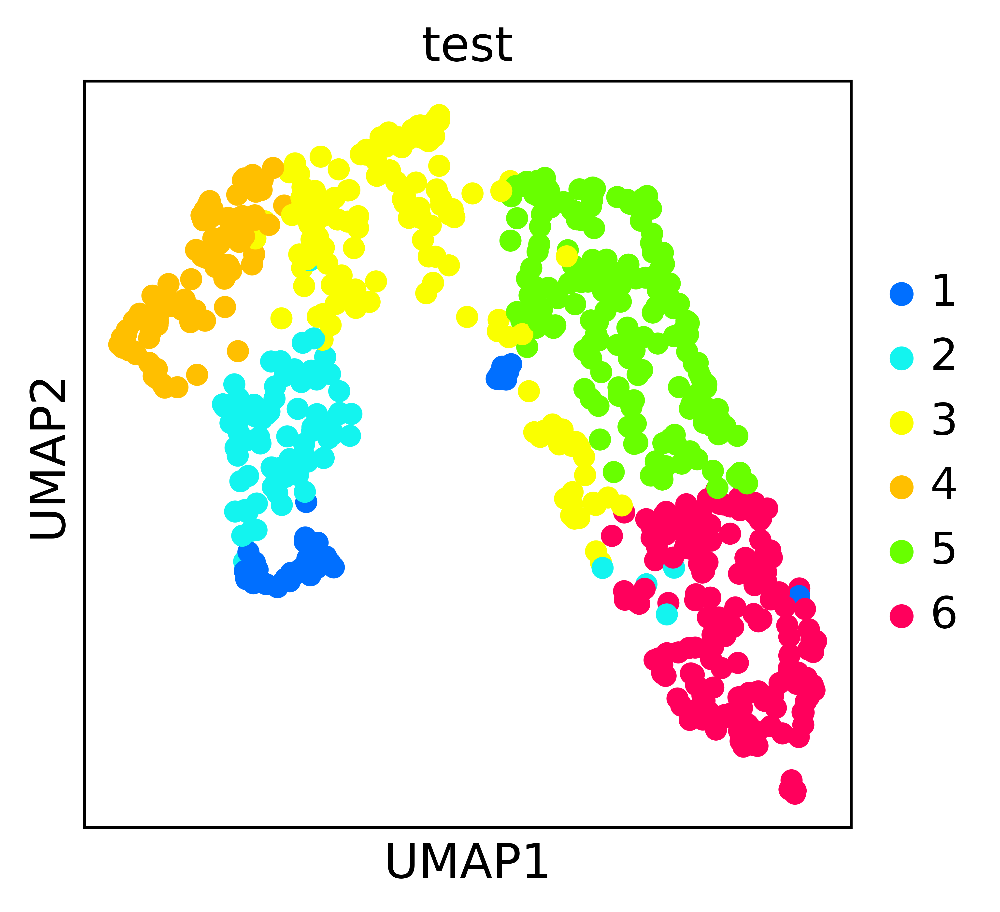

In [19]:
sc.pl.umap(a,color='test')

In [16]:
a.obs['final_cls'] = a.obs['test']
a.uns['final_cls_colors'] = a.uns['test_colors']

In [19]:
# cur_exp_name='test_reorder'
fib=5
hepa_69=1
hepa_normal=2
cls_reorder = reorder_cls(fib,hepa_69,hepa_normal)
a.obs['final_cls'] = cls_reorder
a.obs['final_cls'] = a.obs['final_cls'].astype('category')

In [17]:
fluo_colors = [
    (250/255, 255/255, 0),
    (0, 111/255, 255/255),
    (19/255, 244/255, 239/255),
    (255/255, 191/255, 0),
    (104/255, 255/255, 0),
    (255/255, 0, 92/255),
]
a.uns['final_cls_colors'] = fluo_colors

### scanpy ploting

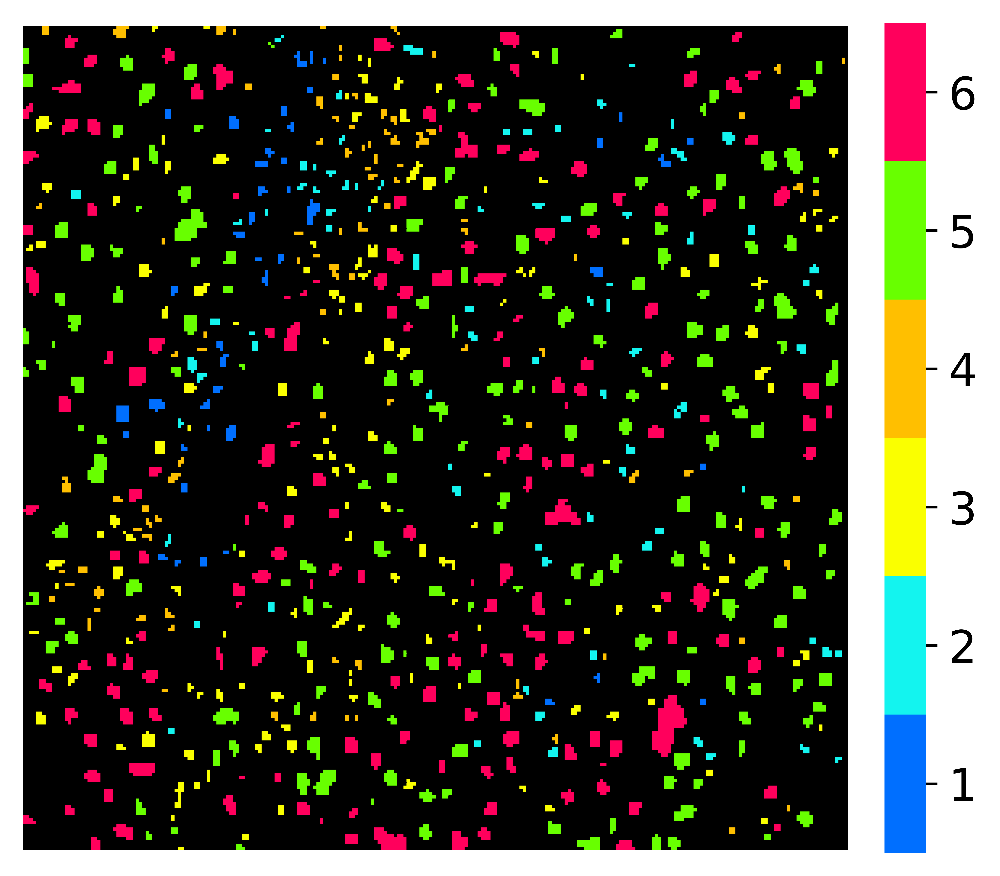

In [22]:
cur_save = 'figures/Supp/{0}/cls_map.png'.format(data)
plot_label_image(a.obs['final_cls'],a.uns['final_cls'+'_colors'],mask=None,save=None)


In [23]:
sc.settings.figdir = 'figures/Supp/{0}/'.format(data)
save_umap = '_dot.png'
fig,ax = plt.subplots(1,1,figsize=(10,10))
sns.set_style('white')

sc.pl.embedding(a,basis='spatial',color='final_cls',
              ax=ax,groups=['5','6'],size=500,save=save_umap)

# sc.pl.embedding(a,basis='spatial',color='final_cls',
#               ax=ax,groups=['5','6'],size=500,save=None)




'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


## hepa dist

In [24]:
# to_show_x = train_x[:,np.where(matter_list==115.35)]
# to_show_x = train_x[:,matter_list==255.21][:,0]
# to_show_x = train_x[:,matter_list==87.36][:,0]
# to_show_x = train_x_HEG[:,9]
# train_x_preprocess = (train_x)/np.sum(train_x,axis=1,keepdims=True)
cell_pos_list = []
to_show_x = train_x[:,matter_list==69.31][:,0]

# to_show_x = train_x_preprocess[:,0]
# to_show_x = order_mat[391,:]

plt.figure(figsize=(20,20))
to_show_img = np.zeros(shape=65536,)
to_show_img[cell_pos-1] = to_show_x
to_show_img=to_show_img.reshape(256,256)
# plt.imshow(to_show_img,cmap='jet')
sns.heatmap(to_show_img,cmap='jet',cbar=False)
for i in range(num_cells):
    cur_idx = i + 1
    cur_ind = cell_pos[cell_idx==cur_idx][0]
    cur_ind_list = cell_pos[cell_idx==cur_idx]
    cur_x_list = []
    cur_y_list = []
    for j in cur_ind_list:
        cur_x = ind2ij(cur_ind,256,1)
        cur_y = ind2ij(cur_ind,256,0)
        cur_x_list.append(cur_x)
        cur_y_list.append(cur_y)
    cur_x_mean = np.mean(cur_x_list)
    cur_y_mean = np.mean(cur_y_list)
#     print(ind2ij(cur_ind,256,0))
#     print(ind2ij(cur_ind,256,1))
    cell_pos_list.append(np.array([cur_x_mean,cur_y_mean]))
    plt.annotate(str(cur_idx-1),(ind2ij(cur_ind,256,1),ind2ij(cur_ind,256,0)),color='red')
    plt.scatter(cur_x_mean, cur_y_mean, s=5, c='red', marker='o')
# plt.colorbar()
# plt.scatter(CV_pos[0],CV_pos[1],s=10,c='blue',marker='o')
# plt.plot([cell_pos_mat[fibro_p1,0],cell_pos_mat[fibro_p2,0]],[cell_pos_mat[fibro_p1,1],cell_pos_mat[fibro_p2,1]])
plt.xticks([])
plt.yticks([])
plt.show()
cell_pos_mat = np.array(cell_pos_list)

In [52]:
cell_pos_mat=a.obsm['spatial']

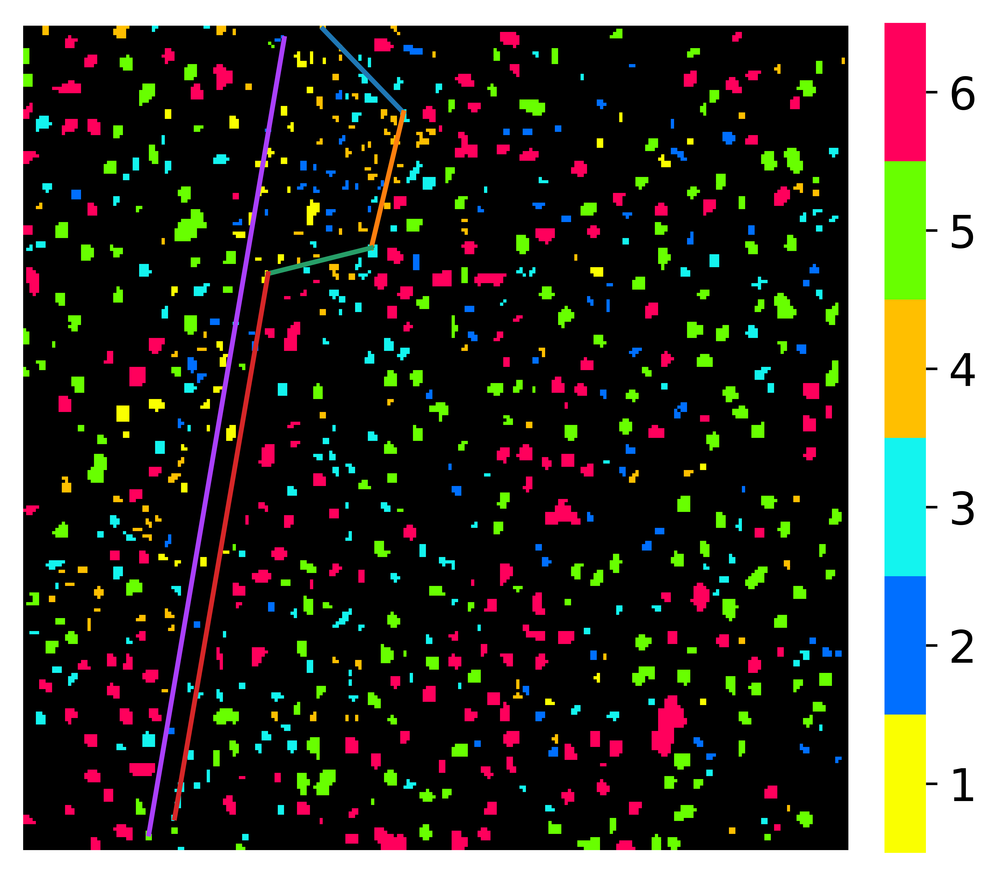

In [22]:
# fibro_p1 = 184
# fibro_p2 = 10
fibro_p1 = 5
fibro_p2 = 73

fibro_p3 = 73
fibro_p4 = 213

# fibro_p4 = 158

# fibro_p5 = 158

fibro_p5 = 213
fibro_p6 = 236

fibro_p7 = 236
fibro_p8 = 692

fibro_p9 = 12
fibro_p10 = 704

# fibro_p1 = 29
# fibro_p2 = 715

cell_pos_mat = a.obsm['spatial']

plot_label_image(a.obs['final_cls'],a.uns['final_cls'+'_colors'],mask=None,ifshow=False)
plt.plot([cell_pos_mat[fibro_p1,0],cell_pos_mat[fibro_p2,0]],[cell_pos_mat[fibro_p1,1],cell_pos_mat[fibro_p2,1]])
plt.plot([cell_pos_mat[fibro_p3,0],cell_pos_mat[fibro_p4,0]],[cell_pos_mat[fibro_p3,1],cell_pos_mat[fibro_p4,1]])
plt.plot([cell_pos_mat[fibro_p5,0],cell_pos_mat[fibro_p6,0]],[cell_pos_mat[fibro_p5,1],cell_pos_mat[fibro_p6,1]])
plt.plot([cell_pos_mat[fibro_p7,0],cell_pos_mat[fibro_p8,0]],[cell_pos_mat[fibro_p7,1],cell_pos_mat[fibro_p8,1]])
plt.plot([cell_pos_mat[fibro_p9,0],cell_pos_mat[fibro_p10,0]],[cell_pos_mat[fibro_p9,1],cell_pos_mat[fibro_p10,1]])


In [44]:
p1_idx = 12
p2_idx = 704
# c_idx = 0
c_idx = 0



cal_cell_line_dist(cell_pos_mat[p1_idx],cell_pos_mat[p2_idx],cell_pos_mat[c_idx])

-73.45574745266589

In [45]:
# 先计算每个细胞距离border的距离
# p1_idx = 29
# p2_idx = 715
p1_idx = 5
p2_idx = 73

p3_idx = 73
p4_idx = 213

# fibro_p4 = 158

# fibro_p5 = 158

p5_idx = 213
p6_idx = 236

p7_idx = 236
p8_idx = 692

p9_idx = 704
p10_idx = 12



fibro_dist = []
exclude_dist = []
for i in range(a.shape[0]):
#     cur_pos = a.obsm['spatial'][i]
    c_idx = i

    cur_dist1 = cal_cell_lineseg_dist(a.obsm['spatial'][p1_idx],a.obsm['spatial'][p2_idx],a.obsm['spatial'][c_idx])
    cur_dist2 = cal_cell_lineseg_dist(a.obsm['spatial'][p3_idx],a.obsm['spatial'][p4_idx],a.obsm['spatial'][c_idx])
    cur_dist3 = cal_cell_lineseg_dist(a.obsm['spatial'][p5_idx],a.obsm['spatial'][p6_idx],a.obsm['spatial'][c_idx])
    cur_dist4 = cal_cell_lineseg_dist(a.obsm['spatial'][p7_idx],a.obsm['spatial'][p8_idx],a.obsm['spatial'][c_idx])
    
#     exclude
    cur_dist_ex = cal_cell_line_dist(a.obsm['spatial'][p9_idx],a.obsm['spatial'][p10_idx],a.obsm['spatial'][c_idx])
    
    fibro_dist.append(min(cur_dist1,cur_dist2,cur_dist3,cur_dist4))
    exclude_dist.append(cur_dist_ex)
a.obs['fibro_dist'] =np.array(fibro_dist)
a.obs['exclude_dist'] = np.array(exclude_dist)
    

In [46]:
a.obs['fibro_dist_mum'] = a.obs['fibro_dist']*400/256

In [41]:
a_69 = a[a.obs['final_cls']=='6']

In [43]:
a_69.obs['fibro_dist_mum'].max()

288.7711674113393

In [ ]:
a_69_ex = a

In [27]:
data='P19_R2'

In [34]:
a_use = a.copy()[:,0]
a_use = a_use[a_use.obs['exclude_dist']<0]

100
200
300
400


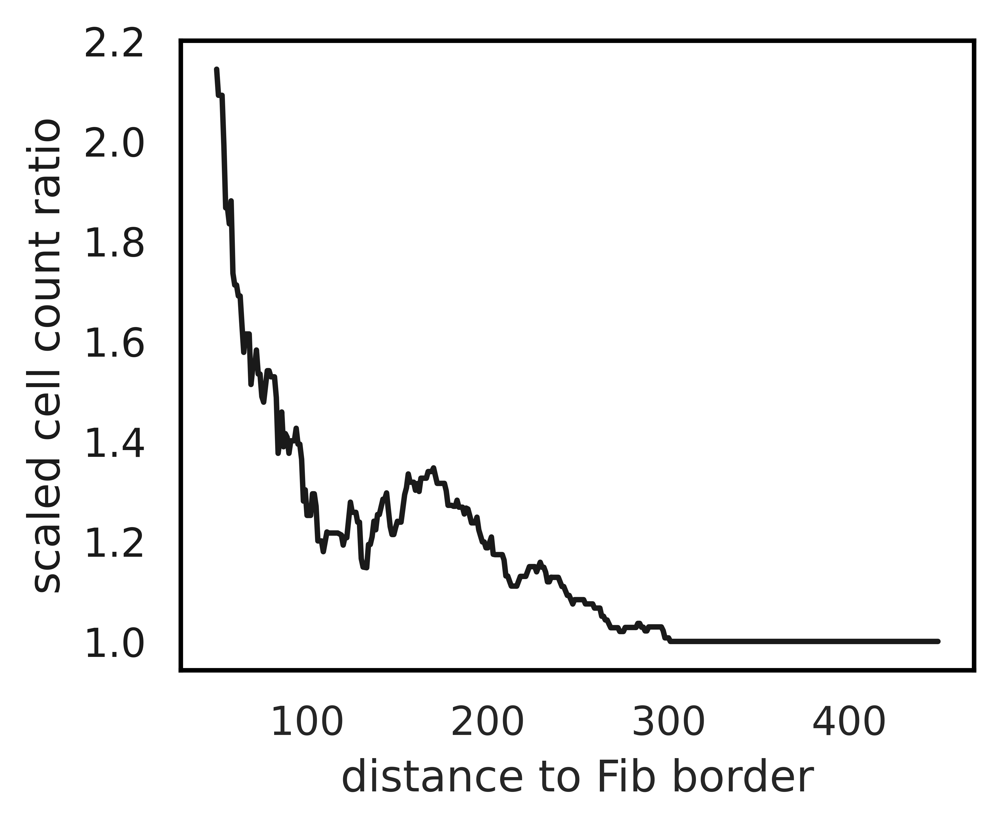

In [47]:
cur_save = 'figures/Supp/{0}/count_ratio.png'.format(data)
a_use = a.copy()[:,0]
a_use = a_use[a_use.obs['exclude_dist']<0]
thre_list,dist_ratio_list,_,hepa_dist_pd_dict,count_ratio_standard_list = get_fibro_stat(a_use,50,1,450)
plot_count_ratio(count_ratio_standard_list,thre_list,cur_save)

100
200
300
400


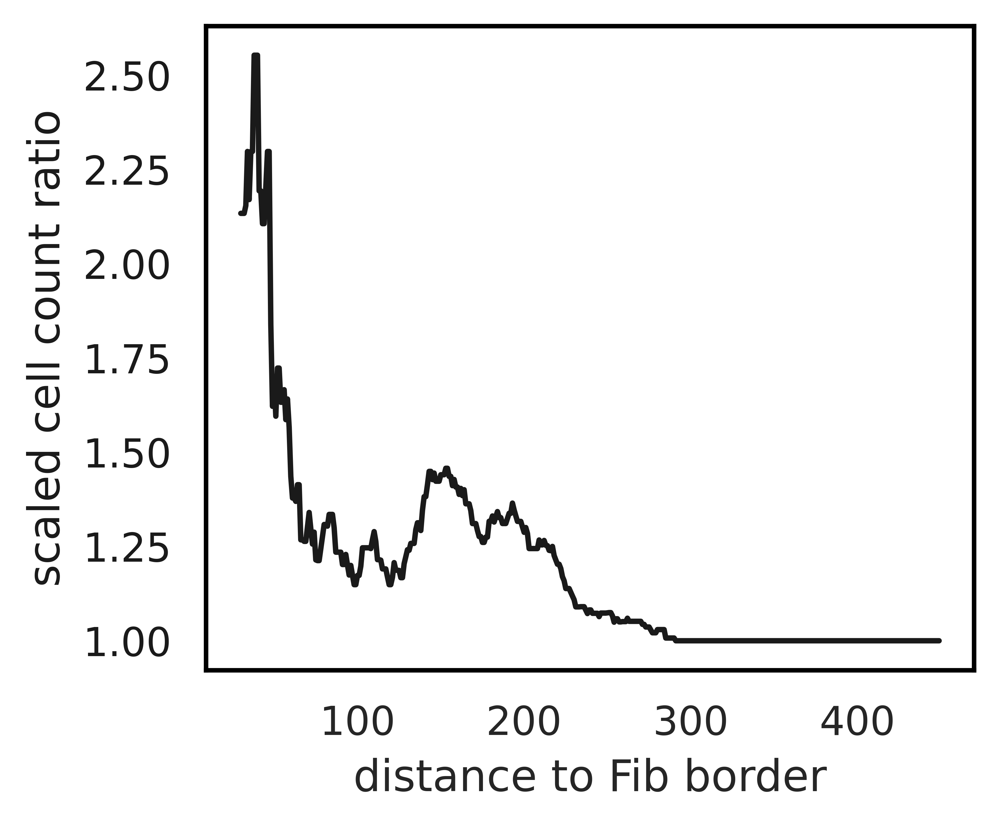

In [91]:
cur_save = 'figures/Supp/{0}/count_ratio.png'.format(data)
a_use = a.copy()
a_use = a_use[:,0]
thre_list,dist_ratio_list,_,hepa_dist_pd_dict,count_ratio_standard_list = get_fibro_stat(a_use,30,1,450)
plot_count_ratio(count_ratio_standard_list,thre_list,cur_save)

In [67]:
a_hepa_69 = a[a.obs['final_cls']=='6']
# a.obs['fibro_dist_mum']

In [73]:
a_hepa_69

View of AnnData object with n_obs × n_vars = 171 × 231 
    obs: 'cls_5', 'cls_5_pca', 'cls_8_pca', 'cls_4', 'leiden', 'cls_5_reorder', 'fibro_dist', 'fibro_dist_mum', 'test', 'final_cls'
    uns: 'cls_4_colors', 'cls_5_colors', 'cls_5_pca_colors', 'cls_5_reorder_colors', 'cls_8_pca_colors', 'leiden', 'leiden_colors', 'neighbors', 'rep_list', 'test_colors', 'umap', 'final_cls_colors'
    obsm: 'X_umap', 'cls_4_rep', 'cls_5_pca_rep', 'cls_5_rep', 'cls_8_pca_rep', 'spatial'

In [75]:
np.sum(a_hepa_69.obs['fibro_dist_mum']<0)

158

In [81]:
pd_df = pd.DataFrame(hepa_dist_pd_dict)

100
200
300
400
500


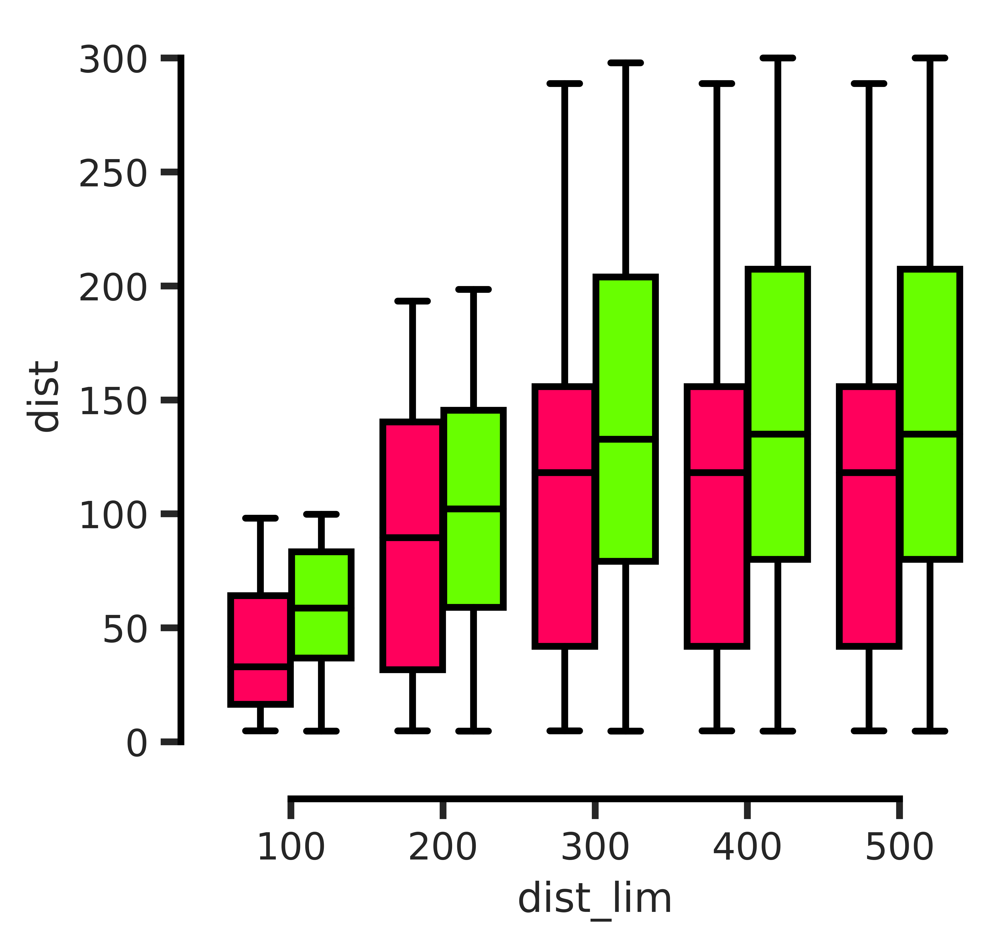

In [48]:
cur_save = 'figures/Supp/{0}/dist_box.png'.format(data)
a_use = a.copy()[:,0]
a_use = a_use[a_use.obs['exclude_dist']<0]
thre_list,dist_ratio_list,_,hepa_dist_pd_dict,count_ratio_standard_list = get_fibro_stat(a_use,100,100,600)
# plot_count_ratio(count_ratio_standard_list,thre_list,cur_save)
plot_dist_box(hepa_dist_pd_dict,cur_save)

In [95]:
np.unique(hepa_dist_pd_df.dist_lim)

array([100, 104, 108, 112, 116, 120, 124, 128, 132, 136, 140, 144, 148,
       152, 156, 160, 164, 168, 172, 176, 180, 184, 188, 192, 196, 200,
       204, 208, 212, 216, 220, 224, 228, 232, 236, 240, 244, 248, 252,
       256, 260, 264, 268, 272, 276, 280, 284, 288, 292, 296, 300, 304,
       308, 312, 316, 320, 324, 328, 332, 336, 340, 344, 348, 352, 356,
       360, 364, 368, 372, 376, 380, 384, 388, 392, 396, 400, 404, 408,
       412, 416, 420, 424, 428, 432, 436, 440, 444, 448, 452, 456, 460,
       464, 468, 472, 476, 480, 484, 488, 492, 496])

# save anndata

In [49]:
data

'P19_R2'

In [50]:
a.write('/home/yzy/ipynbs/figures/Supp/{0}/data.h5ad'.format(data))

In [225]:
a.write('figures/Fig4_dump_data/fig4_csub.h5ad')

In [226]:
a_test = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/fig4_csub.h5ad')


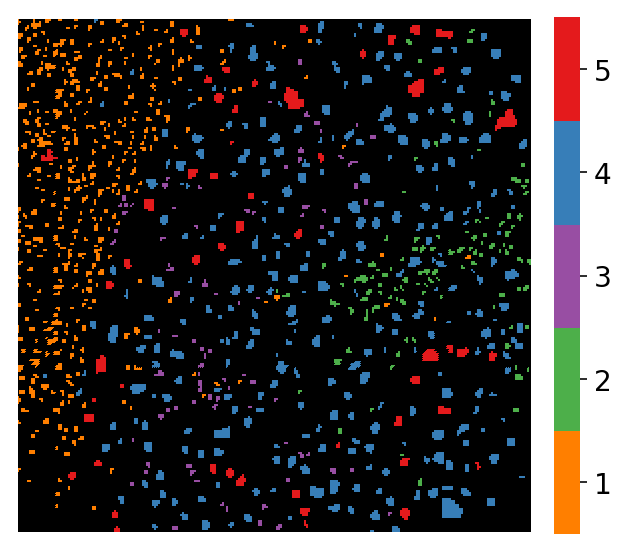

In [227]:
plot_label_image(a_test.obs['cls_sub'],a_test.uns['cls_sub_colors'],mask=[0,1,2,3,4])


In [229]:
1+1

2